In [1]:
%matplotlib inline
import os 
import numpy as np
import scipy as sci
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as pl

import scanpy as sc
import anndata as ann

from scipy.sparse import csr_matrix
from matplotlib import rcParams
from matplotlib import colors


In [2]:
sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 3
sc.settings.n_jobs = 12
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=600,transparent=True)

# Read Data

In [34]:
adata = sc.read_text("./01.UMI.txt.gz").T

anno = pd.read_csv("03.Cell.Barcodes.txt", sep="\t", names=["UMI", "individual", "group"])
anno = anno.set_index("UMI")
adata.obs["group"] = anno["group"]
adata.obs["sample_id"] = anno["individual"]
adata.obs['sample_name'] = adata.obs['sample_id'].astype('category').cat.rename_categories(anno["individual"])

adata.obs['sample_id'].value_counts()

adata.obs['group'].value_counts()


SC    41208
CT    19994
Name: group, dtype: int64

In [35]:
adata

AnnData object with n_obs × n_vars = 61202 × 23384
    obs: 'group', 'sample_id', 'sample_name'

In [36]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name"],
    ).set_index("ensembl_gene_id")
adata.var[annot.columns] = annot

In [37]:
sc.write(adata=adata, filename = './data_mapped_2.h5ad') 

E:\Anaconda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'group' as categorical
... storing 'sample_id' as categorical
... storing 'external_gene_name' as categorical


In [38]:
adata.var.reset_index(inplace=True)
adata.var.set_index("external_gene_name", inplace=True)

In [39]:
adata

AnnData object with n_obs × n_vars = 61202 × 23384
    obs: 'group', 'sample_id', 'sample_name'
    var: 'index'

# Normalize according to paper 

In [40]:
sc.pp.normalize_total(adata)

normalizing counts per cell
    finished (0:00:00)


In [41]:
sc.pp.log1p(adata)

In [42]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:01:21)


In [43]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:30)


In [44]:
sc.tl.umap(adata) 

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:37)


In [45]:
adata.write("./normalized_data.h5d")

E:\Anaconda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [64]:
sc.tl.leiden(adata, resolution=0.5)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:35)


In [65]:
sc.tl.leiden(adata, resolution=2, key_added="leiden_high_res")

running Leiden clustering
    finished: found 32 clusters and added
    'leiden_high_res', the cluster labels (adata.obs, categorical) (0:00:46)


In [66]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


E:\Anaconda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


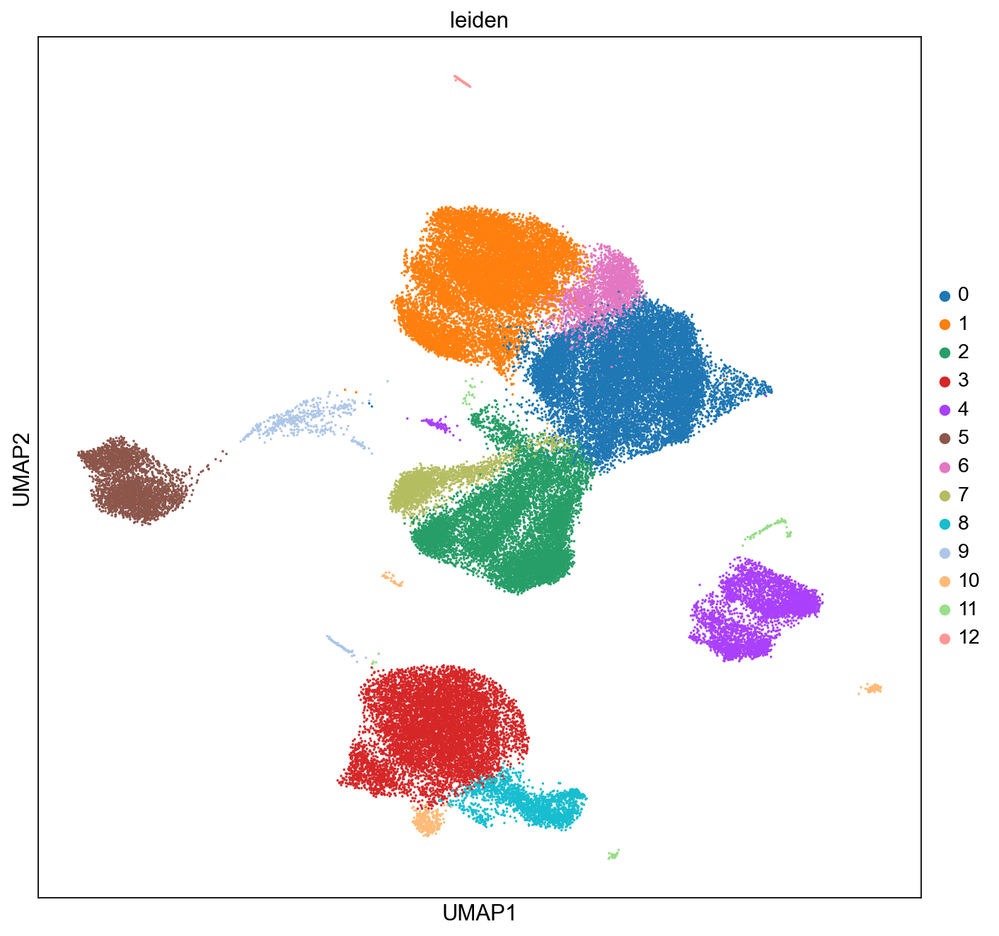

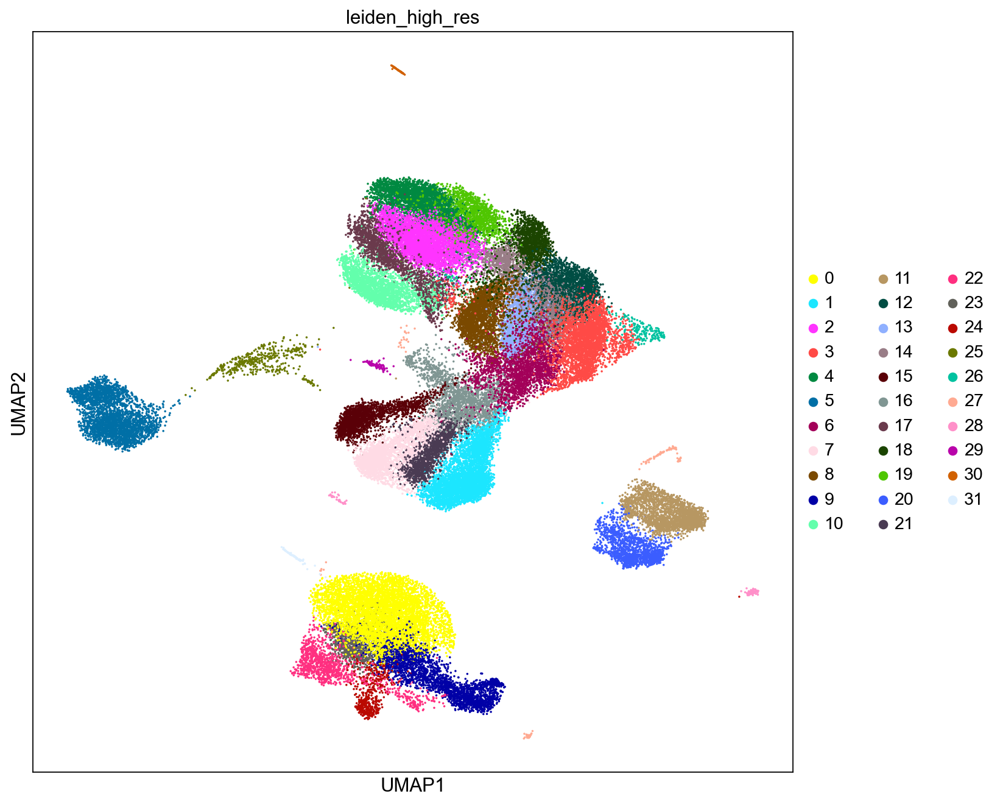

In [67]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color='leiden', size=10)
sc.pl.umap(adata, color='leiden_high_res', size=10)

In [69]:
adata.write("./normalized_data.h5d")

E:\Anaconda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


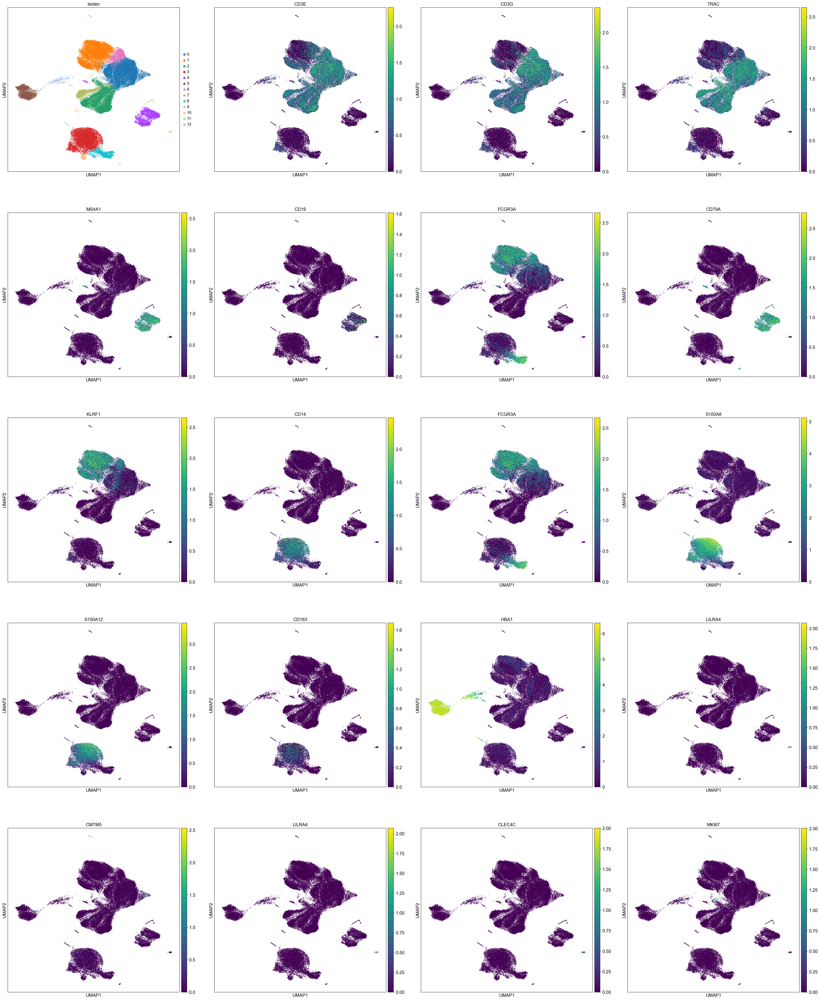

In [71]:
p=sc.pl.umap(adata, color=['leiden', 'CD3E', 'CD3G', 'TRAC',  'MS4A1', 'CD19', "FCGR3A",
                         'CD79A', "KLRF1", "CD14", "FCGR3A", 'S100A8', 'S100A12', 'CD163', 
                         "HBA1","LILRA4", "CMTM5", "LILRA4", "CLEC4C", "MKI67"], size=10, save="_Hashimoto_cell_type_annotation.pdf")


In [75]:
new_annotations = {"0":"T-cell_1",
                   "1":"NKT",
                   "2": "T-cell_2",
                   "3":"MK14",
                   "4":"B-cell",
                   "5":"EC_1",
                   "6":"T-cell_5",
                   "7": "T-cell_4",
                   "8":"MK16",
                   "9":"EC_2",
                   "10":" ",
                   "11":"  ",
                   "12":"   ",
                   "13":"    "
                  }

In [78]:
adata.obs["cell_type"] = adata.obs["leiden"].cat.rename_categories(new_annotations)
adata.obs["cell_type"] = adata.obs["cell_type"].cat.add_categories(["T-cell", "EC"])
adata.obs["cell_type"][np.in1d(adata.obs["cell_type"],["T-cell_1","T-cell_2","T-cell_3","T-cell_4", "T-cell_5"])] = "T-cell"
adata.obs["cell_type"][np.in1d(adata.obs["cell_type"],["EC_1","EC_2"])] = "EC"
adata.obs["cell_type"] = adata.obs["cell_type"].cat.remove_unused_categories()

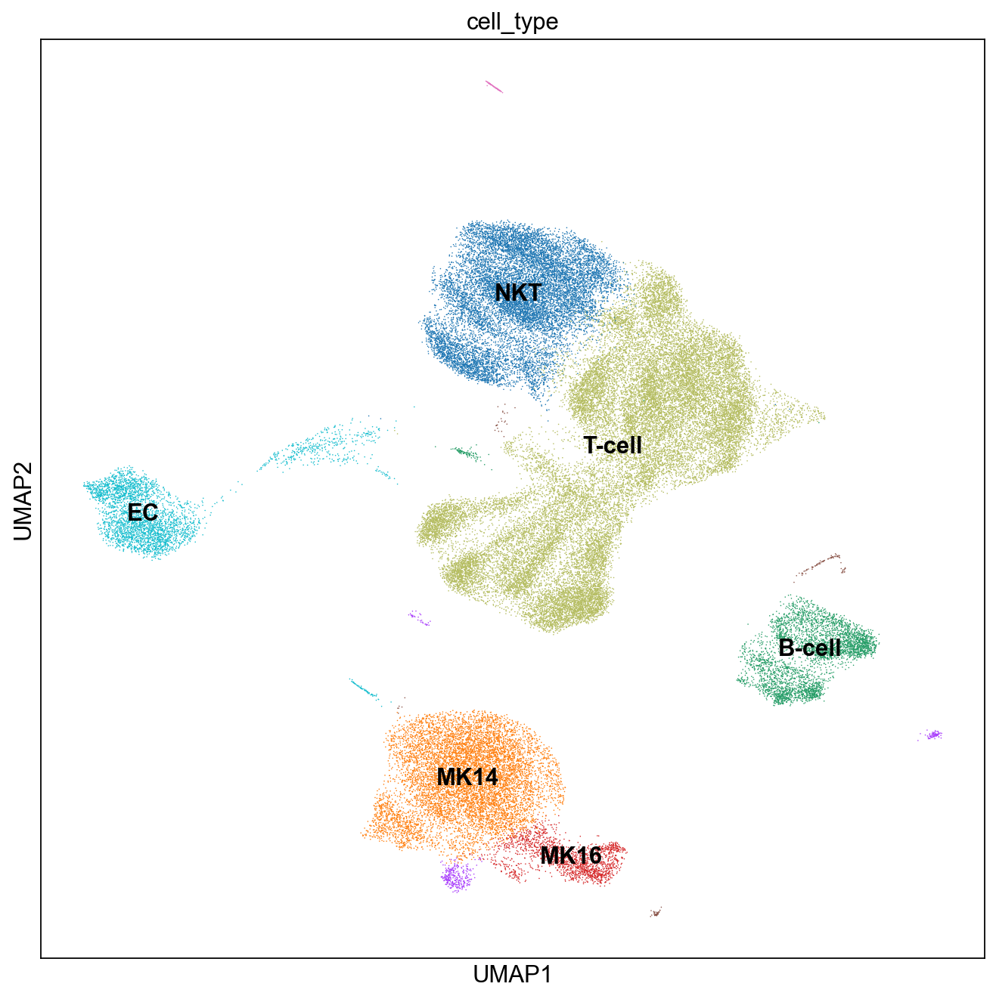

In [80]:
sc.pl.umap(adata, color="cell_type",  legend_loc='on data', save="_hashimoto_cell_types.pdf")

# Statistical Analysis

In [81]:
import sys

sys.path.append("./SCDCdm/")

from scdcdm.util import comp_ana as mod
from scdcdm.util import cell_composition_data as dat
import pandas as pd
import seaborn as sb
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
l = []
adata2 = adata[adata.obs["cell_type"].isin(["B-cell", "T-cell", "NKT", "MK14", "EC"])]
for s in set(adata2.obs["sample_id"]):
    ad = adata2[adata2.obs["sample_id"] == s]
    ad.uns["covariats"] = {"group":ad.obs["group"][0]}
    l.append(ad)

comp_data = dat.from_scanpy_list(l, "cell_type", "covariats")

In [83]:
d = {"group":[], "cell":[], "count":[], "prop":[]}
n,m = comp_data.X.shape
for i in range(n):
    total = np.sum(comp_data.X[i,:])
    for j in range(m-1):
        d["group"].append(comp_data.obs.group[i])
        d["cell"].append(comp_data.var.index[j])
        d["count"].append(comp_data.X[i,j])
        d["prop"].append(comp_data.X[i,j] / total)
df = pd.DataFrame.from_dict(d)
df.head()

,group,cell,count,prop
0,SC,NKT,490.0,0.076146
1,SC,MK14,803.0,0.124786
2,SC,B-cell,190.0,0.029526
3,SC,T-cell,4592.0,0.713598
4,SC,NKT,746.0,0.171415


E:\Anaconda\envs\scanpy\lib\site-packages\seaborn\axisgrid.py:645: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
E:\Anaconda\envs\scanpy\lib\site-packages\seaborn\axisgrid.py:645: UserWarning: Using the swarmplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


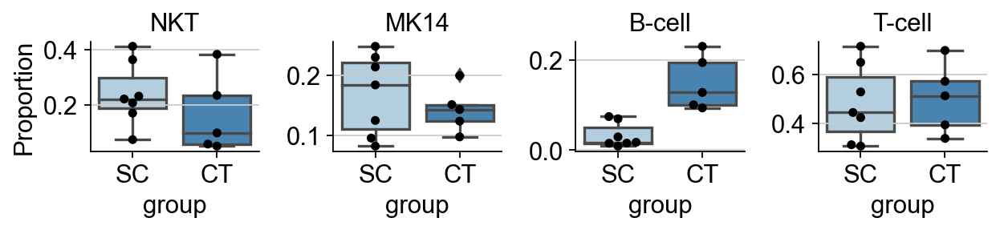

In [84]:
g = sns.FacetGrid(df, col="cell", sharey=False, col_wrap=4, height=2)
g.map(sns.boxplot, "group", "prop", palette="Blues");
g = g.map(sns.swarmplot, "group", "prop", color="black", edgecolor="w").set_titles("{col_name}");
g.axes[0].set_ylabel("Proportion")
plt.savefig('./Hashimoto_proportion.pdf')

In [85]:
comp_data.write("supercentinarians_comp_data.h5d")

E:\Anaconda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'group' as categorical


In [86]:
model_salm = mod.CompositionalAnalysis(comp_data, formula="group", baseline_index="EC")

In [87]:
sim_results = model_salm.sample_hmc(num_results=80000, n_burnin=20000)

MCMC sampling finished. (244.646 sec)
Acceptance rate: 63.2%


./SCDCdm\scdcdm\util\result_classes.py:179: RuntimeWarning: Mean of empty slice.
  beta_nonzero_mean.append(beta_i_raw[beta_i_raw_nonzero].mean())
C:\Users\benni\AppData\Roaming\Python\Python38\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [88]:
sim_results.summary_extended()

Compositional Analysis summary (extended):

Data: 12 samples, 5 cell types
Baseline index: 4
Formula: group
Spike-and-slab threshold: 0.468

MCMC Sampling: Sampled 80000 chain states (20000 burnin samples) in 244.646 sec. Acceptance rate: 63.2%

Intercepts:
           Final Parameter  HDI 3%  HDI 97%     SD  Expected Sample
Cell Type                                                          
NKT                  1.080   0.515    1.615  0.296       836.597268
MK14                 1.028   0.495    1.528  0.277       794.205936
B-cell               0.850  -0.040    1.585  0.442       664.704641
T-cell               2.112   1.595    2.647  0.279      2348.055442
EC                  -0.108  -0.629    0.395  0.275       255.020209


Effects:
                       Final Parameter  HDI 3%  HDI 97%     SD  \
Covariate   Cell Type                                            
group[T.SC] NKT                0.00000  -0.181    0.766  0.253   
            MK14               0.00000  -0.552    0.333  

In [89]:
# saving
import pickle as pkl

path = "supercentenarians_results.pcl"
sim_results.save(path)